# Demo of PyTorch3D renderer for point clouds

Based on PyTorch3D official [tutorial](https://pytorch3d.org/tutorials/render_colored_points)

## Install PyTorch3D

First, [install](https://github.com/facebookresearch/pytorch3d/blob/main/INSTALL.md) `pytorch3d`. Check requirements from installation guide

Make sure you have [compatible](https://pypi.org/project/torchvision/) `torch` and `torchvision` versions

Recommended manual installation from wheels (linux), below command setups PyTorch3D for python3.8 + torch1.11.0 for cuda1.13

```
pip3 install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/py38_cu113_pyt1110/download.html
```

#### The cell below can setup PyTorch3D (stable work not guaranteed)

In [1]:
# # The cell below can setup PyTorch3D (stable work not guaranteed)

# import os
# import sys
# import torch
# need_pytorch3d=False
# try:
#     import pytorch3d
# except ModuleNotFoundError:
#     need_pytorch3d=True
# if need_pytorch3d:
#     if torch.__version__.startswith("1.10.") and sys.platform.startswith("linux"):
#         # We try to install PyTorch3D via a released wheel.
#         pyt_version_str=torch.__version__.split("+")[0].replace(".", "")
#         version_str="".join([
#             f"py3{sys.version_info.minor}_cu",
#             torch.version.cuda.replace(".",""),
#             f"_pyt{pyt_version_str}"
#         ])
#         !pip install fvcore iopath
#         !pip install --no-index --no-cache-dir pytorch3d -f https://dl.fbaipublicfiles.com/pytorch3d/packaging/wheels/{version_str}/download.html
#     else:
#         # We try to install PyTorch3D from source.
#         !curl -LO https://github.com/NVIDIA/cub/archive/1.10.0.tar.gz
#         !tar xzf 1.10.0.tar.gz
#         os.environ["CUB_HOME"] = os.getcwd() + "/cub-1.10.0"
#         !pip install 'git+https://github.com/facebookresearch/pytorch3d.git@stable'

## Import modules

In [2]:
import os
import torch

# Data structures and functions for rendering
from pytorch3d.structures import Pointclouds
from pytorch3d.vis.plotly_vis import plot_scene
from pytorch3d.renderer import (
    look_at_view_transform,
    PerspectiveCameras,
    OrthographicCameras,
    PointsRasterizationSettings,
    PointsRenderer,
    PointsRasterizer,
    AlphaCompositor,
    NormWeightedCompositor
)

Setup device (`cuda`/`cpu`)

In [3]:
# Setup device
if torch.cuda.is_available():
    device = torch.device("cuda:0")
    torch.cuda.set_device(device)
else:
    device = torch.device("cpu")

## Load demo data

In [4]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import torchvision.transforms as transforms

Load data from folder

In [5]:
# Data for demo folder contains RGB and Depth image
# and intrinsic camera parameters (Azure Kinect)
DATA_DIR = "./data_demo"
image_filename = os.path.join(DATA_DIR, "image.jpg")
depth_filename = os.path.join(DATA_DIR, "depth.png")
intrinsic_image_filename = os.path.join(DATA_DIR, "image_intrinsic.txt")
intrinsic_depth_filename = os.path.join(DATA_DIR, "depth_intrinsic.txt")

# Import images as numpy arrays
# and intrinsic matrices as 3x3 matrix
# |f_x,   0, c_x|
# |  0, f_y, c_y|
# |  0,   0,   1|
transform = transforms.Compose([
    transforms.PILToTensor()
])

image = transform(Image.open(image_filename)).to(device) / 255
depth = transform(Image.open(depth_filename)).to(device)
intrinsic_image = np.loadtxt(intrinsic_image_filename)
intrinsic_depth = np.loadtxt(intrinsic_depth_filename)

Form variables from loaded matrices

In [6]:
def get_focal_from_intrinsic(intrinsic):
    return (intrinsic[0, 0], intrinsic[1, 1])

def get_principal_from_intrinsic(intrinsic):
    return (intrinsic[0, 2], intrinsic[1, 2])

In [7]:
# Image sizes
image_size = image.shape[1:]
depth_size = depth.shape[1:]

# Focal length and Principal point in Screen space
focal_length_image = get_focal_from_intrinsic(intrinsic_image)
principal_point_image = get_principal_from_intrinsic(intrinsic_image)

focal_length_depth = get_focal_from_intrinsic(intrinsic_depth)
principal_point_depth = get_principal_from_intrinsic(intrinsic_depth)

# Identity transformation
# OpenCV coordinate system is X-right, Y-down, Z-out, and PyTorch3D is X-left, Y-up, Z-out
# Note: If passed to camera parametrs, it will rotate world according to OpenCV coordinates
R_I = torch.tensor([[[1., 0., 0.],
                     [0., 1., 0.],
                     [0., 0., 1.]]], device=device)
T_I = torch.tensor([[0., 0., 0.]], device=device)

Output results

In [8]:
# Output results
# Image sizes
print(f"Color image size:\n{image_size}")
print(f"Depth image size:\n{depth_size}\n")

# Focals and Principals in screen space
print(f"Focal image:\n{focal_length_image}")
print(f"Principal image:\n{principal_point_image}\n")

print(f"Focal depth:\n{focal_length_depth}")
print(f"Principal depth:\n{principal_point_depth}\n")

Color image size:
torch.Size([1080, 1920])
Depth image size:
torch.Size([1080, 1920])

Focal image:
(899.444213, 898.802856)
Principal image:
(957.821105, 548.647827)

Focal depth:
(899.444213, 898.802856)
Principal depth:
(957.821105, 548.647827)



#### Plot loaded images

Image resolution: torch.Size([3, 1080, 1920])
Depth resolution: torch.Size([1, 1080, 1920])


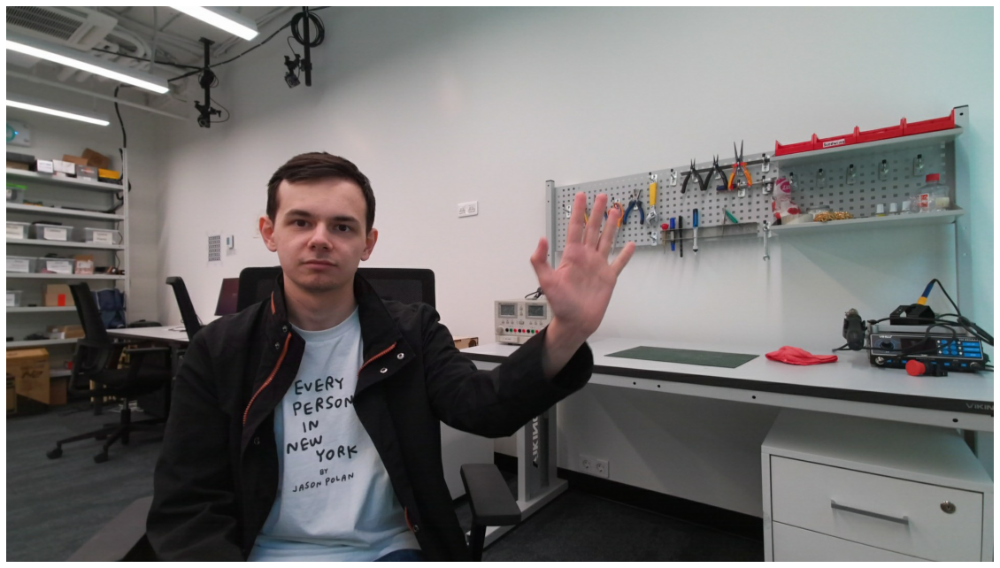

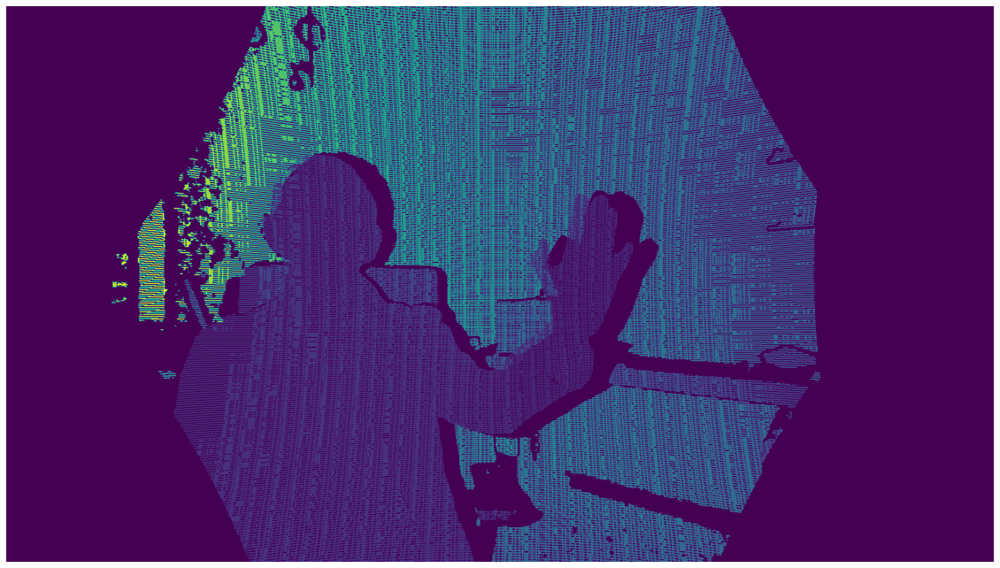

In [9]:
# Resolutions
print(f"Image resolution: {image.shape}")
print(f"Depth resolution: {depth.shape}")

# RGB image
plt.figure(figsize=(20, 40))
plt.imshow(image.permute(1, 2, 0).cpu())
plt.axis("off")

# Depth image
plt.figure(figsize=(20, 40))
plt.imshow(depth.permute(1, 2, 0).cpu())
plt.axis("off");

## Transform Depth image to color image

### Get 3D point cloud of depth

Using the intrinsics of Depth transform depth to 3D world, then using the intrinsic of Color image transform 3D depth to color image.

Function to make `tensor(..., 3)` from depth image

In [10]:
def depth_to_list(depth):
    """Transform a depth image into a point cloud with one point for each
    pixel in the image.

    depth is a 2-D ndarray with shape (rows, cols)
    The result is a 3-D array with shape (rows, cols, 3)
    Pixels with invalid depth not processed
    """
    # Calculate coordinates
    _, rows, cols = depth.shape
    x, y = torch.meshgrid(torch.arange(cols, device=device),
                          torch.arange(rows, device=device),
                          indexing='xy')
    # Mask pixels (which has depth info)
    valid = (0 < depth[0])
    
    coords = torch.dstack((x, y, depth[0]))

    return coords[valid]

Supportive functions to lead points in 3D to PyTorch coordinate system from OpenCV coordinate system

`OpenCV` coordinate system is $X$-right, $Y$-down, $Z$-out, and `PyTorch3D` is $X$-left, $Y$-up, $Z$-outs ([more info](https://github.com/facebookresearch/pytorch3d/issues/522#issuecomment-762793832))

Note: trick with negative focal length works only when $[R|T] = I$

In [11]:
def fix_R_to_pt3d_coords(R):
    """
    R: rotation matrix
    """
    R_fixed = R.detach().clone()
    R_fixed[:, :, :2] = -R_fixed[:, :, :2]
    return R_fixed

def fix_T_to_pt3d_coords(T):
    """
    T: translation matrix
    """
    T_fixed = T.detach().clone()
    T_fixed[:, 2] = -T_fixed[:, 2]
    return T_fixed

Get 3D point cloud of depth

In [12]:
R_depth = R_I
T_depth = T_I
# R_depth = torch.tensor([[[np.cos(30/180*np.pi), -np.sin(30/180*np.pi), 0.],
#                      [np.sin(30/180*np.pi), np.cos(30/180*np.pi)*np.cos(30/180*np.pi), -np.sin(30/180*np.pi)],
#                      [0., np.sin(30/180*np.pi), np.cos(30/180*np.pi)]]], device=device)
# T_depth = torch.tensor([[220., -1000., -1000.]], device=device)

In [13]:
depth_cameras = PerspectiveCameras(
    focal_length=(focal_length_depth,),
    principal_point=(principal_point_depth,),
    R=R_depth,
    T=T_depth,
    # K: Optional[torch.Tensor] = None,
    device=device,
    in_ndc=False,
    image_size=(depth_size,))

depth_list = depth_to_list(depth)

# Change coordinate system in R and T (check functions info above)
# Note: R and T arguments rewrites the camera's original R and T for future operations also
depth_cloud = depth_cameras.unproject_points(depth_list, world_coordinates=True,
                                             R=fix_R_to_pt3d_coords(R_depth),
                                             T=fix_T_to_pt3d_coords(T_depth))

In [14]:
depth_pc = Pointclouds(points=[depth_cloud])

In [15]:
plot_scene(
    {
        "Pointcloud": {
            "person": depth_pc,
        }
    },
    xaxis=dict(backgroundcolor="rgb(200, 200, 230)"),
    yaxis=dict(backgroundcolor="rgb(230, 200, 200)"),
    zaxis=dict(backgroundcolor="rgb(200, 230, 200)"),
)

Check if 3D points are projected back on the same place

In [16]:
depth_back = depth_cameras.transform_points_screen(depth_cloud, R=R_depth, T=-T_depth)
depth_back[:, 2] = 1 / depth_back[:, 2]
depth_back = depth_back.round().long()

In [17]:
(depth_list == depth_back).all()

tensor(True, device='cuda:0')

### Project points on color image

In [18]:
R_image = R_I
T_image = T_I

In [19]:
image_cameras = PerspectiveCameras(
    focal_length=(focal_length_image,),
    principal_point=(principal_point_image,),
    R=R_I,
    T=T_I,
    # K: Optional[torch.Tensor] = None,
    device=device,
    in_ndc=False,
    image_size=(image_size,))

In [20]:
depth_on_image = image_cameras.transform_points_screen(depth_cloud, R=R_image, T=-T_image)
depth_on_image[:, 2] = 1 / depth_on_image[:, 2]
depth_on_image = depth_on_image.round().long()

# Filter outer indexes
depth_index = ((0 <= depth_on_image[:, 0]) *
               (depth_on_image[:, 0] < image_size[1]) *
               (0 <= depth_on_image[:, 1]) * 
               (depth_on_image[:, 1] < image_size[0]))

depth_on_image = depth_on_image[depth_index]

Create mask where colors will be taken in purpose to check whether it correct

In [21]:
# Create mask
mask = torch.full((image_size[0], image_size[1]), False)
mask[depth_on_image[:, 1], depth_on_image[:, 0]] = True

Check the mask

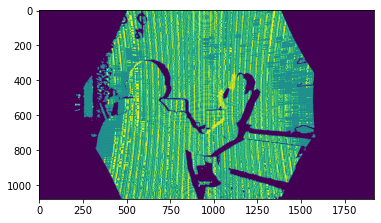

In [22]:
plt.imshow(mask);

Unproject points from color Image with Depth and form Point cloud

In [23]:
# Alpha constant for rasterizing
alpha = 0.9961

# Coordinates of points
coords = image_cameras.unproject_points(depth_on_image, world_coordinates=True,
                                        R=fix_R_to_pt3d_coords(R_image),
                                        T=fix_T_to_pt3d_coords(T_image))

# Colors of points
colors = torch.hstack([image[:,
                             depth_on_image[:, 1],
                             depth_on_image[:, 0]].T,
                       torch.full((coords.shape[0], 1), alpha, device=device)])

# Form colored Point cloud
point_cloud = Pointclouds(points=[coords], features=[colors])

#### Plot point cloud

In [24]:
plot_scene(
    {
        "Pointcloud": {
            "person": point_cloud,
        }
    },
    xaxis=dict(backgroundcolor="rgb(200, 200, 230)"),
    yaxis=dict(backgroundcolor="rgb(230, 200, 200)"),
    zaxis=dict(backgroundcolor="rgb(200, 230, 200)"),
)

## Render point cloud

Renderer consists of `rasterizer` and `compositor`

`rasterizer` responsible for how each point should looks like ([source](https://github.com/facebookresearch/pytorch3d/blob/a999fc22ee84b1dfefa2a2d8f9ee41e2f937d33b/pytorch3d/renderer/points/rasterizer.py#L56-L71)). `rasterizer` uses camera parameters, here is used `PerspectiveCameras`

`compositor` responsible for how to combine points located on one ray path ([source](https://github.com/facebookresearch/pytorch3d/blob/34f648ede0e52a38dfc378ad38b191ee7f1d2855/pytorch3d/renderer/points/compositor.py#L20-L39))

[1] <a href="https://arxiv.org/abs/1912.08804">SynSin: End to end View Synthesis from a Single Image.</a> Olivia Wiles, Georgia Gkioxari, Richard Szeliski, Justin Johnson. CVPR 2020.

In [25]:
del alpha, colors, coords, DATA_DIR, depth_back, depth_cloud
del depth_filename, depth_index, depth_list, depth_on_image
del depth_pc, image_filename, mask, transform

In [30]:
image_cameras.R = R_image
image_cameras.T = T_image

radius = 6 / 1000 * min(focal_length_image) / min(image_size)
# Define the settings for rasterization
# Refer to raster_points.py for explanations of these parameters
raster_settings = PointsRasterizationSettings(
    image_size=image_size, 
    radius=radius,
    points_per_pixel=8
)

# Create a points renderer by compositing points using an alpha compositor
# where nearer points are weighted more heavily
# See [1] for an explanation
rasterizer = PointsRasterizer(
    cameras=image_cameras, 
    raster_settings=raster_settings)
renderer = PointsRenderer(
    rasterizer=rasterizer,
    compositor=AlphaCompositor()
)

# Get image
images = renderer(point_cloud)

#### Plot image and background

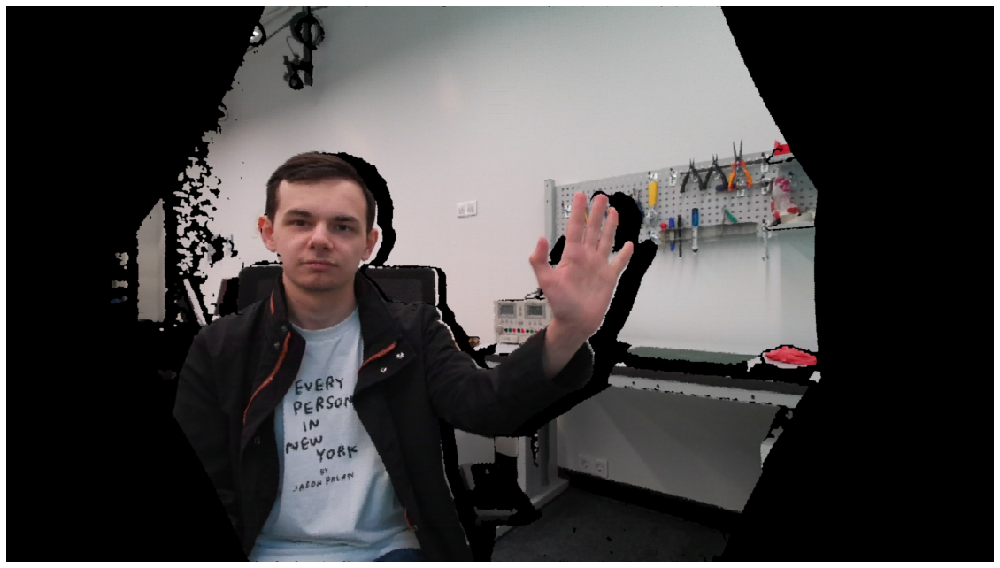

In [31]:
plt.figure(figsize=(20, 20))
plt.imshow(images[0, ..., :3].cpu().numpy())
plt.axis("off");

Add background on the image

In [32]:
images_back = images[0, ..., :3].cpu().numpy()
images_back = np.where(images_back == 0, image.permute(1, 2, 0).cpu().numpy(), images_back)

Plot image with background

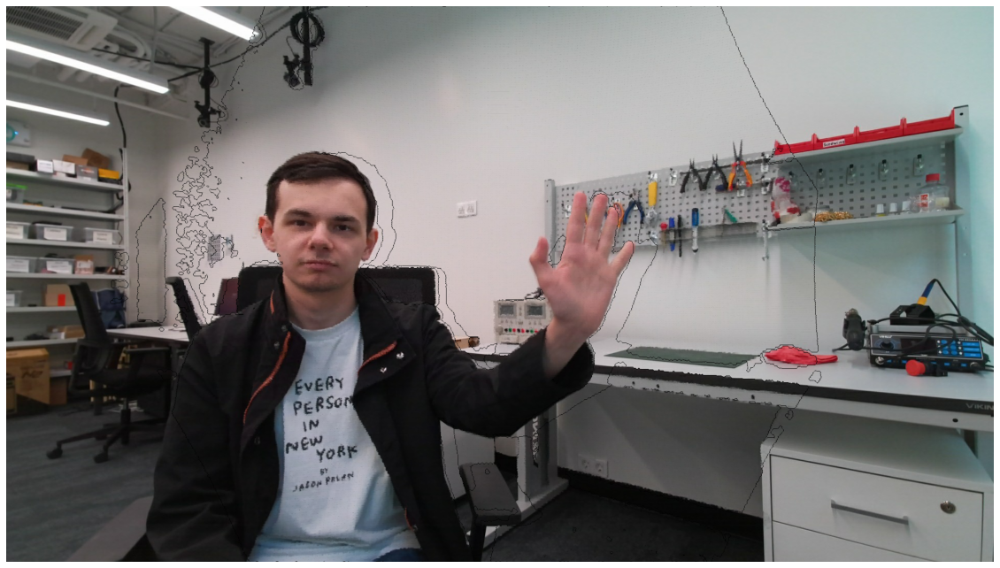

In [33]:
plt.figure(figsize=(20, 20))
plt.imshow(images_back)
plt.axis("off");

## Changing the point of view

Function `look_at_view_transform` provides `R` and `T` matrixes ([docs](https://pytorch3d.readthedocs.io/en/latest/modules/renderer/cameras.html?highlight=look_at_view_transform#pytorch3d.renderer.cameras.look_at_view_transform))

**TODO**: Describe geometry proccess and formulas

In [88]:
# Number of new images
n = 4
images_n = torch.zeros(0, *image_size, 4, device=device)

# Buffer for plot title
elev_buf = []
azim_buf = []

for i in range(n):
    # Variables and Target
    elevation_angle = torch.zeros(1).uniform_(-15, 15).item() - 30
    azimuth_angle = torch.zeros(1).uniform_(-45, 45).item()
    z_target = focal_length_image[0] / 2
    FOV_vertical = 59

    # Save to buffer (display on plot)
    elev_buf.append(elevation_angle)
    azim_buf.append(azimuth_angle)

    # To radians
    elevation_angle = np.deg2rad(elevation_angle)
    azimuth_angle = np.deg2rad(azimuth_angle)
    FOV_vertical = np.deg2rad(FOV_vertical)

    # Calculations
    cos_fr = np.cos(FOV_vertical) / (np.cos(FOV_vertical) + 1)
    tan_th = np.tan(FOV_vertical)
    tan_th_2 = np.tan(FOV_vertical / 2)
    cos_a = np.cos(elevation_angle)
    tan_a = np.tan(elevation_angle)

    # Camera position
    z_camera = z_target * (1 - cos_fr * cos_a ** 2 - cos_fr * cos_a * pow(cos_a **2 + tan_th ** 2, 1/2))
    y_camera = -tan_a * (z_camera - z_target)
    k_camera = (z_camera * tan_th_2 - y_camera) / (z_target * (1 + tan_th_2 ** 2) - z_camera - y_camera * tan_th_2)

    # Angles
    angle_camera = np.arctan(k_camera)
    angle_cos = np.cos(angle_camera)
    angle_sin = np.sin(angle_camera)

    # Another method
    # R, T = look_at_view_transform(eye=torch.tensor([[0., 0., 0.]]), at=torch.tensor([[0., -0.3, 0.5]]))

    # R, T matrices (due to coordinate system)
    T = torch.tensor([[0., -y_camera, z_camera]],
                    dtype=torch.float64, device=device)
    R = torch.tensor([[[1., 0., 0.],
                    [0., angle_cos, angle_sin],
                    [0., -angle_sin, angle_cos]]],
                    dtype=torch.float64, device=device)

    # Add azimuth rotation after elevation
    angle_azim_cos = np.cos(azimuth_angle)
    angle_azim_sin = np.sin(azimuth_angle)

    R_azim = torch.tensor([[[angle_azim_cos, 0., angle_azim_sin],
                            [0., 1., 0.],
                            [-angle_azim_sin, 0., angle_azim_cos]]],
                            dtype=torch.float64, device=device)
    R = R_azim @ R

    # Calibrated focal length to match image size
    cameras_n = PerspectiveCameras(
        focal_length=(focal_length_image,),
        principal_point=(principal_point_image,),
        R=R,
        T=T,
        device=device,
        in_ndc=False,
        image_size=(image_size,)
    )

    # Define the settings for rasterization
    # Refer to raster_points.py for explanations of these parameters

    # Increased points radius due to angle of view
    raster_settings = PointsRasterizationSettings(
        image_size=image_size,
        radius=radius * 1.2,
        points_per_pixel=8
    )

    # Create a points renderer by compositing points using an alpha compositor
    # where nearer points are weighted more heavily
    # See [1] for an explanation
    rasterizer = PointsRasterizer(
        cameras=cameras_n,
        raster_settings=raster_settings
    )
    renderer = PointsRenderer(
        rasterizer=rasterizer,
        compositor=AlphaCompositor()
    )

    # Get images
    images_n = torch.cat((images_n, renderer(point_cloud)))

#### Plot new images

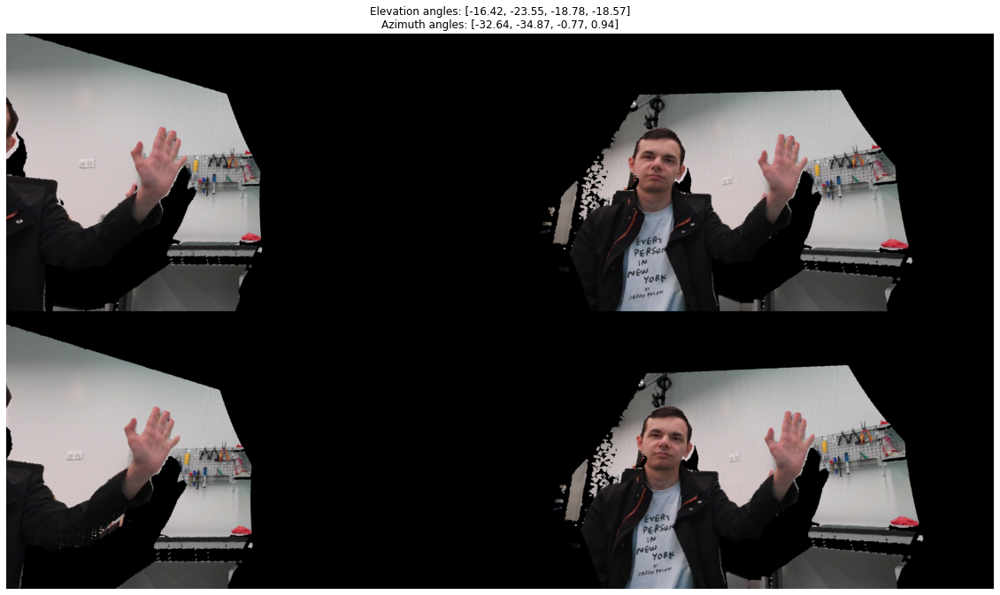

In [89]:
image_n = np.hstack([np.vstack(images_n[:n//2, ..., :3].cpu().numpy()),
                     np.vstack(images_n[n//2:, ..., :3].cpu().numpy())])
plt.figure(figsize=(20, 40))
plt.title(f"Elevation angles: {list(map(lambda x: round(x, 2), elev_buf))}\n\
Azimuth angles: {list(map(lambda x: round(x, 2), azim_buf))}")
plt.imshow(image_n)
plt.axis("off");